In [1]:
from basicsr.train import train_pipeline


/usr/local/lib/python3.8/dist-packages/torchvision/transforms/functional_tensor.py:5: UserWarning: The torchvision.transforms.functional_tensor module is deprecated in 0.15 and will be **removed in 0.17**. Please don't rely on it. You probably just need to use APIs in torchvision.transforms.functional or in torchvision.transforms.v2.functional.
  warnings.warn(


In [ ]:
import os
from collections import defaultdict
from torch.utils.data import DataLoader, Dataset, BatchSampler, SequentialSampler

# Angenommen, dies ist Ihr Dataset
class MeinDataset(Dataset):
    def __init__(self, datenverzeichnis):
        # Extrahieren der Dateinamen
        self.dateinamen = os.listdir(datenverzeichnis)
        # Gruppieren der Dateien nach Tile und Crop
        self.gruppen = defaultdict(list)
        for dateiname in self.dateinamen:
            teile = dateiname.split('_')
            tile_code = teile[5]
            crop_code = teile[-2] + '_' + teile[-1].split('.')[0]
            self.gruppen[(tile_code, crop_code)].append(dateiname)

    def __len__(self):
        return len(self.dateinamen)

    def __getitem__(self, idx):
        # Laden und Zurückgeben eines Datenpunkts
        dateiname = self.dateinamen[idx]
        # Laden Sie hier das Bild oder den Datenpunkt
        return dateiname

# Benutzerdefinierter BatchSampler
class MeinBatchSampler(BatchSampler):
    def __init__(self, dataset, batch_size):
        self.dataset = dataset
        self.batch_size = batch_size
        self.sampler = SequentialSampler(self.dataset)

    def __iter__(self):
        for _, gruppe in self.dataset.gruppen.items():
            # Mischen der Gruppe, falls gewünscht
            # random.shuffle(gruppe)
            for i in range(0, len(gruppe), self.batch_size):
                yield [self.dataset.dateinamen.index(dateiname) for dateiname in gruppe[i:i+self.batch_size]]

    def __len__(self):
        return sum((len(gruppe) // self.batch_size for gruppe in self.dataset.gruppen.values()))

# Verwendung des benutzerdefinierten BatchSamplers
datenverzeichnis = '/home/jovyan/work/saved_data/HAT/datasets/SI2gt'
dataset = MeinDataset(datenverzeichnis)
batch_sampler = MeinBatchSampler(dataset, batch_size=4)
data_loader = DataLoader(dataset, batch_sampler=batch_sampler)

for batch in data_loader:
    # Extrahiere die Dateinamen für den aktuellen Batch
    dateinamen_im_batch = batch
    
    # Ausgeben der Dateinamen
    print("Dateinamen in diesem Batch:", dateinamen_im_batch)

    # Fügen Sie hier den Code hinzu, um die Daten zu verarbeiten
    # Zum Beispiel Laden der Bilder, Anwenden von Transformationen, etc.

In [16]:
import os
from collections import defaultdict
from torch.utils.data import DataLoader, Dataset, BatchSampler, SequentialSampler
from torch.utils import data as data
from torchvision.transforms.functional import normalize

from basicsr.data.data_util import paired_paths_from_folder, paired_paths_from_lmdb, paired_paths_from_meta_info_file
from basicsr.data.transforms import augment, paired_random_crop
from basicsr.utils import FileClient, bgr2ycbcr, imfrombytes, img2tensor
from basicsr.utils.registry import DATASET_REGISTRY


class PairedImageDataset(Dataset):
    """Paired image dataset for image restoration.

    Read LQ (Low Quality, e.g. LR (Low Resolution), blurry, noisy, etc) and GT image pairs.

    There are three modes:

    1. **lmdb**: Use lmdb files. If opt['io_backend'] == lmdb.
    2. **meta_info_file**: Use meta information file to generate paths. \
        If opt['io_backend'] != lmdb and opt['meta_info_file'] is not None.
    3. **folder**: Scan folders to generate paths. The rest.

    Args:
        opt (dict): Config for train datasets. It contains the following keys:
        dataroot_gt (str): Data root path for gt.
        dataroot_lq (str): Data root path for lq.
        meta_info_file (str): Path for meta information file.
        io_backend (dict): IO backend type and other kwarg.
        filename_tmpl (str): Template for each filename. Note that the template excludes the file extension.
            Default: '{}'.
        gt_size (int): Cropped patched size for gt patches.
        use_hflip (bool): Use horizontal flips.
        use_rot (bool): Use rotation (use vertical flip and transposing h and w for implementation).
        scale (bool): Scale, which will be added automatically.
        phase (str): 'train' or 'val'.
    """

    def __init__(self, opt):
        super(PairedImageDataset, self).__init__()
        self.opt = opt
        # file client (io backend)
        self.file_client = None
        self.io_backend_opt = opt['io_backend']
        self.mean = opt['mean'] if 'mean' in opt else None
        self.std = opt['std'] if 'std' in opt else None

        self.gt_folder, self.lq_folder = opt['dataroot_gt'], opt['dataroot_lq']
        if 'filename_tmpl' in opt:
            self.filename_tmpl = opt['filename_tmpl']
        else:
            self.filename_tmpl = '{}'

        if self.io_backend_opt['type'] == 'lmdb':
            self.io_backend_opt['db_paths'] = [self.lq_folder, self.gt_folder]
            self.io_backend_opt['client_keys'] = ['lq', 'gt']
            self.paths = paired_paths_from_lmdb([self.lq_folder, self.gt_folder], ['lq', 'gt'])
        elif 'meta_info_file' in self.opt and self.opt['meta_info_file'] is not None:
            self.paths = paired_paths_from_meta_info_file([self.lq_folder, self.gt_folder], ['lq', 'gt'],
                                                          self.opt['meta_info_file'], self.filename_tmpl)
        else:
            self.paths = paired_paths_from_folder([self.lq_folder, self.gt_folder], ['lq', 'gt'], self.filename_tmpl)

        # Gruppieren der Dateien nach Tile und Crop
        self.gruppen = defaultdict(list)
        for pfad in self.paths:
            # Für GT und LQ sollten die Dateinamen identisch sein, also verwenden wir GT-Pfade
            dateiname = os.path.basename(pfad['gt_path'])
            teile = dateiname.split('_')
            tile_code = teile[5]
            crop_code = teile[-2] + '_' + teile[-1].split('.')[0]
            self.gruppen[(tile_code, crop_code)].append(pfad)

        # Erstellen einer flachen Liste aller Pfade für die einfache Indizierung
        self.flache_pfadliste = [pfad for gruppe in self.gruppen.values() for pfad in gruppe]

    def __getitem__(self, index):
        if self.file_client is None:
            self.file_client = FileClient(self.io_backend_opt.pop('type'), **self.io_backend_opt)
            
        scale = self.opt['scale']

        # Load gt and lq images. Dimension order: HWC; channel order: BGR;
        # image range: [0, 1], float32.
        gt_path = self.paths[index]['gt_path']
        img_bytes = self.file_client.get(gt_path, 'gt')
        img_gt = imfrombytes(img_bytes, float32=True)
        lq_path = self.paths[index]['lq_path']
        img_bytes = self.file_client.get(lq_path, 'lq')
        img_lq = imfrombytes(img_bytes, float32=True)

        # augmentation for training
        if self.opt['phase'] == 'train':
            gt_size = self.opt['gt_size']
            # random crop
            img_gt, img_lq = paired_random_crop(img_gt, img_lq, gt_size, scale, gt_path)
            # flip, rotation
            img_gt, img_lq = augment([img_gt, img_lq], self.opt['use_hflip'], self.opt['use_rot'])

        # color space transform
        if 'color' in self.opt and self.opt['color'] == 'y':
            img_gt = bgr2ycbcr(img_gt, y_only=True)[..., None]
            img_lq = bgr2ycbcr(img_lq, y_only=True)[..., None]

        # crop the unmatched GT images during validation or testing, especially for SR benchmark datasets
        # TODO: It is better to update the datasets, rather than force to crop
        if self.opt['phase'] != 'train':
            img_gt = img_gt[0:img_lq.shape[0] * scale, 0:img_lq.shape[1] * scale, :]

        # BGR to RGB, HWC to CHW, numpy to tensor
        img_gt, img_lq = img2tensor([img_gt, img_lq], bgr2rgb=True, float32=True)
        # normalize
        if self.mean is not None or self.std is not None:
            normalize(img_lq, self.mean, self.std, inplace=True)
            normalize(img_gt, self.mean, self.std, inplace=True)

        return {'lq': img_lq, 'gt': img_gt, 'lq_path': lq_path, 'gt_path': gt_path}

    def __len__(self):
        return len(self.paths)


In [18]:
# Beispielkonfiguration für das Dataset
opt = {
    'dataroot_gt': '/home/jovyan/work/saved_data/HAT/datasets/SI2gt',  # Pfad zu den GT-Bildern
    'dataroot_lq': '/home/jovyan/work/saved_data/HAT/datasets/SI2lq',  # Pfad zu den LQ-Bildern
    'io_backend': {'type': 'disk'},  # Angenommen, Sie verwenden das Dateisystem
    'gt_size': 128,  # Größe der zugeschnittenen GT-Bilder
    'use_hflip': True,  # Horizontale Spiegelung aktivieren
    'use_rot': True,  # Rotation aktivieren
    'scale': 2,  # Skalierungsfaktor für Super-Resolution
    'phase': 'train',  # Trainingsphase
    'mean': [0.5, 0.5, 0.5],  # Mittelwert für die Normalisierung
    'std': [0.5, 0.5, 0.5],  # Standardabweichung für die Normalisierung
}

# Erstellen des PairedImageDataset
dataset = PairedImageDataset(opt)

# Abrufen und Anzeigen einiger Beispiele aus dem Dataset
for i in range(5):
    sample = dataset[i]
    print(f"Beispiel {i}:")
    print("LQ Bild Pfad:", sample['lq_path'])
    print("GT Bild Pfad:", sample['gt_path'])
    # Hier können Sie weitere Verarbeitungen hinzufügen, z.B. die Bilder anzeigen


Beispiel 0:
LQ Bild Pfad: /home/jovyan/work/saved_data/HAT/datasets/SI2lq/S2B_MSIL1C_20210306T100029_N0209_R122_T33UWS_20210306T121335_crop_28_63.png
GT Bild Pfad: /home/jovyan/work/saved_data/HAT/datasets/SI2gt/S2B_MSIL1C_20210306T100029_N0209_R122_T33UWS_20210306T121335_crop_28_63.png
Beispiel 1:
LQ Bild Pfad: /home/jovyan/work/saved_data/HAT/datasets/SI2lq/S2A_MSIL1C_20220724T100041_N0400_R122_T33UWS_20220724T120137_crop_16_7.png
GT Bild Pfad: /home/jovyan/work/saved_data/HAT/datasets/SI2gt/S2A_MSIL1C_20220724T100041_N0400_R122_T33UWS_20220724T120137_crop_16_7.png
Beispiel 2:
LQ Bild Pfad: /home/jovyan/work/saved_data/HAT/datasets/SI2lq/S2B_MSIL1C_20210306T100029_N0209_R122_T33UWS_20210306T121335_crop_31_51.png
GT Bild Pfad: /home/jovyan/work/saved_data/HAT/datasets/SI2gt/S2B_MSIL1C_20210306T100029_N0209_R122_T33UWS_20210306T121335_crop_31_51.png
Beispiel 3:
LQ Bild Pfad: /home/jovyan/work/saved_data/HAT/datasets/SI2lq/S2A_MSIL1C_20220724T100041_N0400_R122_T33UWS_20220724T120137_cro

In [27]:
import zipfile
import os

# Setzen Sie den Pfad zur ZIP-Datei
zip_file_path = '/home/jovyan/work/saved_data/simg-benchmark/S2_WV2_benchmarkPartA.zip_'

# Setzen Sie den Zielordner, in den die Dateien entpackt werden sollen
target_directory = '/home/jovyan/work/saved_data/sbench/'

# Überprüfen, ob der Zielordner existiert, und ihn ggf. erstellen
if not os.path.exists(target_directory):
    os.makedirs(target_directory)

# Entpacken der ZIP-Datei
with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    zip_ref.extractall(target_directory)

print("ZIP-Datei erfolgreich entpackt!")


ZIP-Datei erfolgreich entpackt!


In [29]:
import cv2

img = cv2.imread('/home/jovyan/work/saved_data/sbench/masks/relevance_masks_b2/mask_0_31UFT_11JUN031102-2AS_R4C1_Bicubic.tif', cv2.IMREAD_UNCHANGED)
print(img.shape)

(1965, 1686)


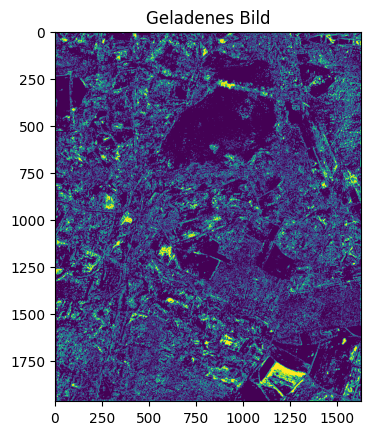

In [17]:
from PIL import Image
import matplotlib.pyplot as plt

# Pfad zum Bild
image_path = '/home/jovyan/work/saved_data/sbench/masks/relevance_masks_b2/mask_1_33UUT_15MAR221037-2AS_R08C1_Bicubic.tif'

# Versuchen, das Bild mit PIL zu laden
try:
    img = Image.open(image_path)
    plt.imshow(img)  # cmap='gray' ist optional
    plt.title("Geladenes Bild")
    plt.show()
except IOError:
    print("Fehler beim Laden des Bildes.")


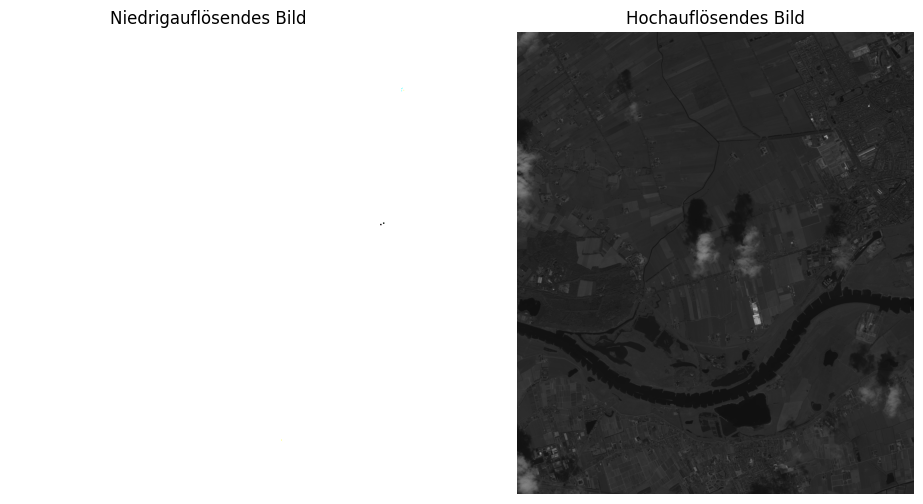

In [15]:
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np

def open_and_convert(path, mode='RGB'):
    # Bild öffnen und in den gewünschten Modus konvertieren
    return Image.open(path).convert(mode)

def combine_bands_to_rgb(b2_path, b3_path, b4_path):
    # Laden der einzelnen Bänder und Konvertierung in den Modus 'L' (Graustufen)
    band_b = open_and_convert(b2_path, 'L')
    band_g = open_and_convert(b3_path, 'L')
    band_r = open_and_convert(b4_path, 'L')

    # Zusammenführen der Bänder zu einem RGB-Bild
    rgb_image = Image.merge("RGB", (band_r, band_g, band_b))
    return rgb_image

def plot_rgb_comparison(hr_path, b2_path, b3_path, b4_path):
    # HR-Bild laden und in RGB umwandeln
    hr_image = open_and_convert(hr_path, 'RGB')
    
    # LR-Bild als RGB zusammensetzen
    lr_image = combine_bands_to_rgb(b2_path, b3_path, b4_path)

    # Zwei Bilder nebeneinander plotten
    fig, axs = plt.subplots(1, 2, figsize=(12, 6))
    axs[0].imshow(lr_image)
    axs[0].set_title('Niedrigauflösendes Bild')
    axs[0].axis('off')

    axs[1].imshow(hr_image)
    axs[1].set_title('Hochauflösendes Bild')
    axs[1].axis('off')

    plt.show()

# Verwenden Sie den aktualisierten Code mit den Pfaden zu Ihren Bildern


# Pfade zu Ihren Bildern (ersetzen Sie diese durch die tatsächlichen Pfade)
hr_path = '/home/jovyan/work/saved_data/sbench/image_data/0_31UFT_11JUN031102-2AS_R4C1/hr_resized/pan.tiff'
b2_path = '/home/jovyan/work/saved_data/sbench/image_data/0_31UFT_11JUN031102-2AS_R4C1/b2/lrs/S2A_MSIL2A_20190416T105031_N0211_R051_T31UFT_20190416T133651.jp2'
b3_path = '/home/jovyan/work/saved_data/sbench/image_data/0_31UFT_11JUN031102-2AS_R4C1/b3/lrs/S2A_MSIL2A_20190416T105031_N0211_R051_T31UFT_20190416T133651.jp2'
b4_path = '/home/jovyan/work/saved_data/sbench/image_data/0_31UFT_11JUN031102-2AS_R4C1/b4/lrs/S2A_MSIL2A_20190416T105031_N0211_R051_T31UFT_20190416T133651.jp2'

plot_rgb_comparison(hr_path, b2_path, b3_path, b4_path)


In [12]:
img = np.load('/home/jovyan/work/saved_data/sbench/image_data/0_31UFT_11JUN031102-2AS_R4C1/hr_resized/mul_band_3.tiff')
img.shape

ValueError: Cannot load file containing pickled data when allow_pickle=False

In [13]:
from PIL import Image
import numpy as np

def load_tiff_image(image_path):
    with Image.open(image_path) as img:
        return np.array(img)

# Pfad zur TIFF-Datei
tiff_path = '/home/jovyan/work/saved_data/sbench/image_data/0_31UFT_11JUN031102-2AS_R4C1/hr_resized/mul_band_3.tiff'

# Laden und Anzeigen der Bildabmessungen
img = load_tiff_image(tiff_path)
print(img.shape)


(1965, 1686)


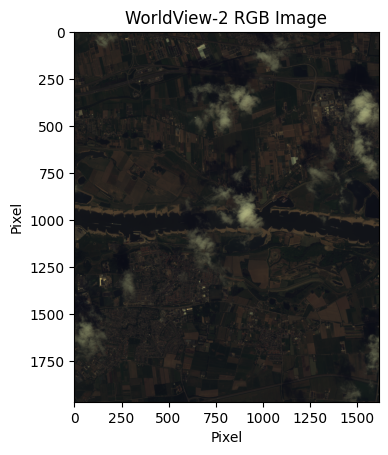

In [38]:
import matplotlib.pyplot as plt
import rasterio
import numpy as np

def plot_wv2_rgb(red_path, green_path, blue_path):
    """
    Plots the RGB channels of a WorldView-2 image, with each channel in a separate file.
    
    Parameters:
    red_path (str): Pfad zur Datei des Rotkanals.
    green_path (str): Pfad zur Datei des Grünkanals.
    blue_path (str): Pfad zur Datei des Blaukanals.
    """
    # Rotkanal lesen
    with rasterio.open(red_path) as src:
        red = src.read(1)  # Annahme: das relevante Band ist das erste Band

    # Grünkanal lesen
    with rasterio.open(green_path) as src:
        green = src.read(1)  # Annahme: das relevante Band ist das erste Band

    # Blaukanal lesen
    with rasterio.open(blue_path) as src:
        blue = src.read(1)  # Annahme: das relevante Band ist das erste Band

    # RGB-Bild zusammensetzen
    rgb = np.dstack((red, green, blue))
    plt.imsave('/home/jovyan/work/saved_data/simg-benchmark/wv2.png', rgb)


    # RGB-Bild plotten
    plt.imshow(rgb)
    plt.title('WorldView-2 RGB Image')
    plt.xlabel('Pixel')
    plt.ylabel('Pixel')
    plt.show()

# Beispielaufruf der Funktio
plot_wv2_rgb('/home/jovyan/work/saved_data/sbench/image_data/0_31UFT_11JUN031102-2AS_R5C1/hr_resized/mul_band_4.tiff', 
             '/home/jovyan/work/saved_data/sbench/image_data/0_31UFT_11JUN031102-2AS_R5C1/hr_resized/mul_band_2.tiff', 
             '/home/jovyan/work/saved_data/sbench/image_data/0_31UFT_11JUN031102-2AS_R5C1/hr_resized/mul_band_1.tiff')


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


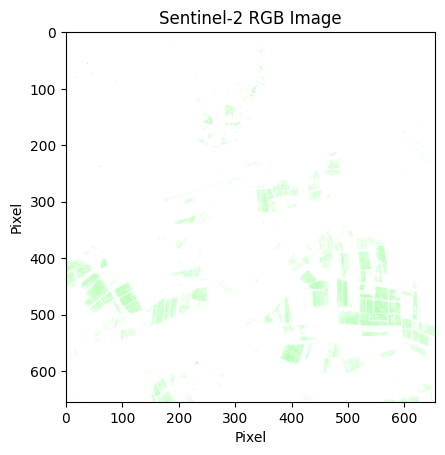

In [28]:
import matplotlib.pyplot as plt
import rasterio
import numpy as np

def plot_sentinel2_rgb(red_band_path, green_band_path, blue_band_path):
    """
    Plots the RGB channels of a Sentinel-2 image, with each channel in a separate JP2 file.
    
    Parameters:
    red_band_path (str): Pfad zur JP2-Datei des Rotkanals (B04).
    green_band_path (str): Pfad zur JP2-Datei des Grünkanals (B03).
    blue_band_path (str): Pfad zur JP2-Datei des Blaukanals (B02).
    """
    # Rotkanal lesen
    with rasterio.open(red_band_path) as src:
        red = src.read(1)  # Das relevante Band ist das erste Band

    # Grünkanal lesen
    with rasterio.open(green_band_path) as src:
        green = src.read(1)  # Das relevante Band ist das erste Band

    # Blaukanal lesen
    with rasterio.open(blue_band_path) as src:
        blue = src.read(1)  # Das relevante Band ist das erste Band

    # RGB-Bild zusammensetzen
    rgb = np.dstack((red, green, blue))

    # RGB-Bild plotten
    plt.imshow(rgb)
    plt.title('Sentinel-2 RGB Image')
    plt.xlabel('Pixel')
    plt.ylabel('Pixel')
    plt.show()

# Beispielaufruf der Funktion
plot_sentinel2_rgb('/home/jovyan/work/saved_data/sbench/image_data/0_31UFT_11JUN031102-2AS_R4C2/b4/lrs/S2A_MSIL2A_20190416T105031_N0211_R051_T31UFT_20190416T133651.jp2',
'/home/jovyan/work/saved_data/sbench/image_data/0_31UFT_11JUN031102-2AS_R4C2/b3/lrs/S2A_MSIL2A_20190416T105031_N0211_R051_T31UFT_20190416T133651.jp2', 
'/home/jovyan/work/saved_data/sbench/image_data/0_31UFT_11JUN031102-2AS_R4C2/b4/lrs/S2A_MSIL2A_20190416T105031_N0211_R051_T31UFT_20190416T133651.jp2')


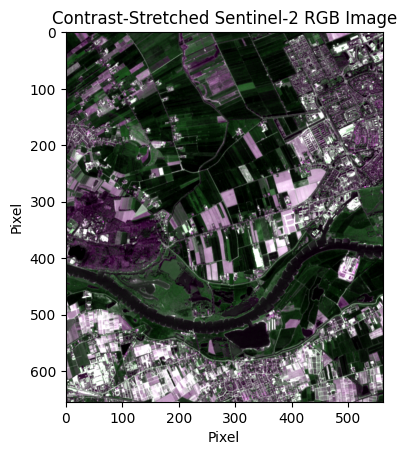

In [21]:
import numpy as np
import matplotlib.pyplot as plt
import rasterio

def stretch_contrast(array, lower_percent=2, upper_percent=98):
    """Streckt den Kontrast des Bildes, indem die unteren und oberen x Prozent abgeschnitten werden."""
    a = np.percentile(array, lower_percent)
    b = np.percentile(array, upper_percent)
    stretched = np.clip(array, a, b)
    return (stretched - a) / (b - a)

def plot_stretched_sentinel2_rgb(red_band_path, green_band_path, blue_band_path):
    """
    Plots the contrast-stretched RGB channels of a Sentinel-2 image.
    
    Parameters:
    red_band_path (str): Pfad zur Datei des Rotkanals.
    green_band_path (str): Pfad zur Datei des Grünkanals.
    blue_band_path (str): Pfad zur Datei des Blaukanals.
    """
    # Rotkanal lesen und Kontrast strecken
    with rasterio.open(red_band_path) as src:
        red = stretch_contrast(src.read(1))

    # Grünkanal lesen und Kontrast strecken
    with rasterio.open(green_band_path) as src:
        green = stretch_contrast(src.read(1))

    # Blaukanal lesen und Kontrast strecken
    with rasterio.open(blue_band_path) as src:
        blue = stretch_contrast(src.read(1))

    # RGB-Bild zusammensetzen
    rgb = np.dstack((red, green, blue))

    # RGB-Bild plotten
    plt.imshow(rgb)
    plt.title('Contrast-Stretched Sentinel-2 RGB Image')
    plt.xlabel('Pixel')
    plt.ylabel('Pixel')
    plt.show()

# Beispielaufruf der Funktion
plot_stretched_sentinel2_rgb('/home/jovyan/work/saved_data/sbench/image_data/0_31UFT_11JUN031102-2AS_R4C1/b4/lrs/S2A_MSIL2A_20190416T105031_N0211_R051_T31UFT_20190416T133651.jp2',
'/home/jovyan/work/saved_data/sbench/image_data/0_31UFT_11JUN031102-2AS_R4C1/b3/lrs/S2A_MSIL2A_20190416T105031_N0211_R051_T31UFT_20190416T133651.jp2', 
'/home/jovyan/work/saved_data/sbench/image_data/0_31UFT_11JUN031102-2AS_R4C1/b4/lrs/S2A_MSIL2A_20190416T105031_N0211_R051_T31UFT_20190416T133651.jp2')


In [22]:
import rasterio

def print_band_values(jp2_path):
    """
    Druckt die Werte eines Bandes in einer JP2-Datei aus.
    
    Parameters:
    jp2_path (str): Pfad zur JP2-Datei des Bandes.
    """
    # JP2-Datei öffnen
    with rasterio.open(jp2_path) as src:
        # Banddaten lesen
        band_data = src.read(1)
        print(band_data)

# Beispielaufruf der Funktion für ein Band
print_band_values('/home/jovyan/work/saved_data/sbench/image_data/0_31UFT_11JUN031102-2AS_R4C1/b4/lrs/S2A_MSIL2A_20190416T105031_N0211_R051_T31UFT_20190416T133651.jp2')


[[ 437  627  525 ...  907  937  790]
 [ 515  441  328 ... 1185 1300 1141]
 [ 362  267  295 ... 1409 1256 1076]
 ...
 [1469  688  727 ...  282  273  273]
 [1407  717  627 ...  311  285  308]
 [1689  834  588 ...  405  386  360]]


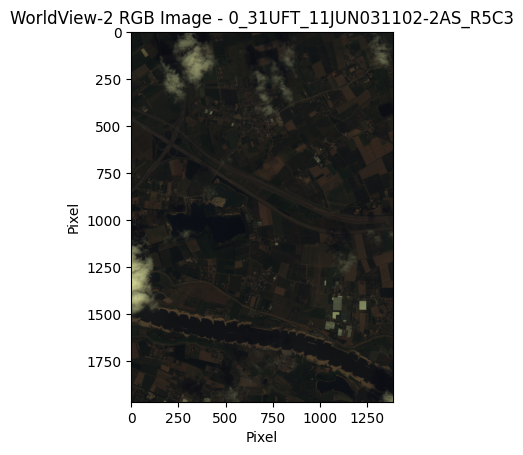

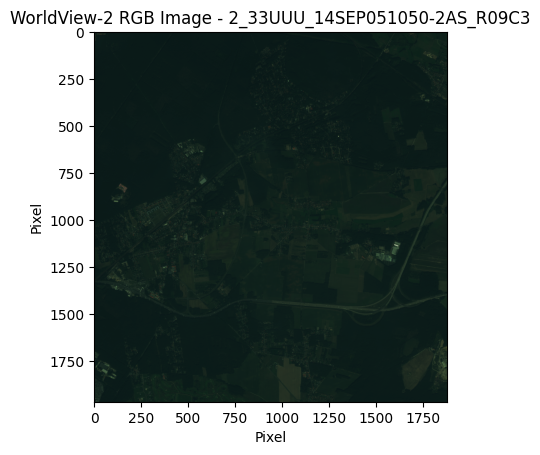

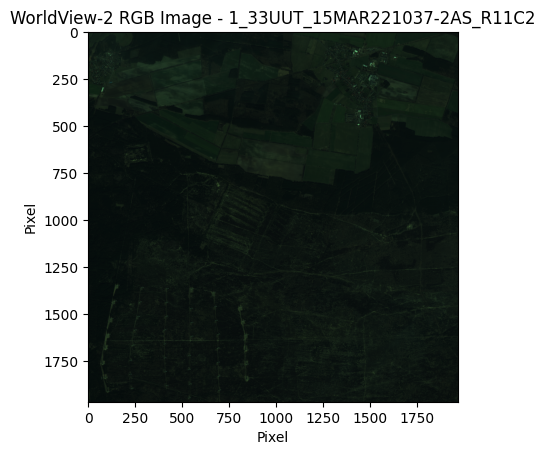

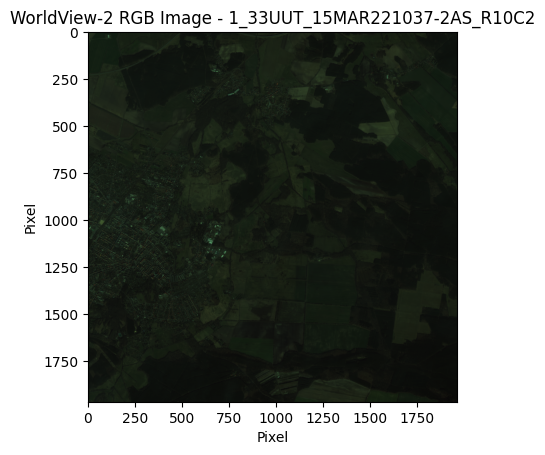

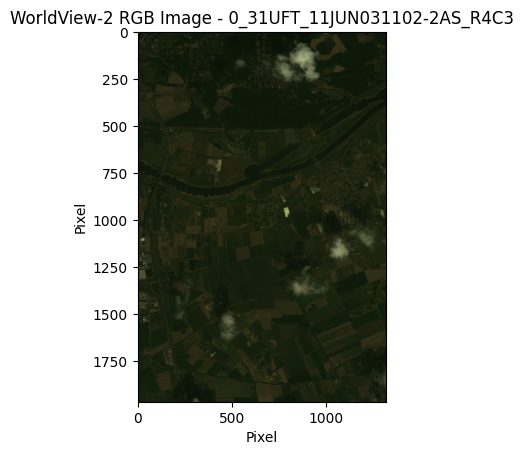

...

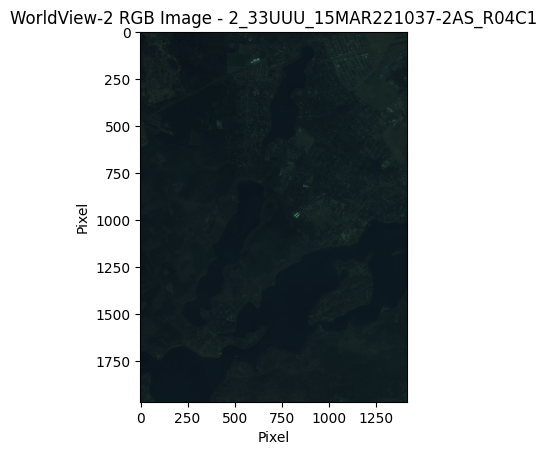

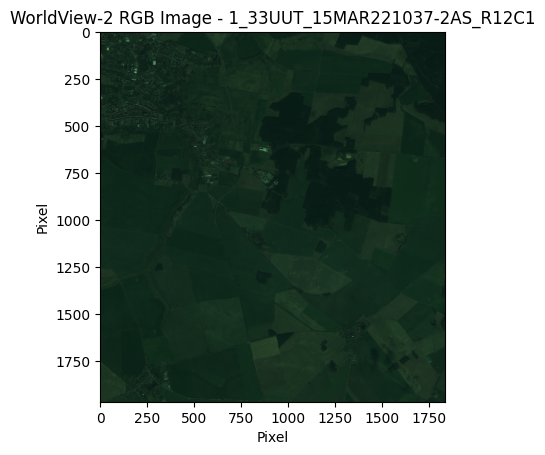

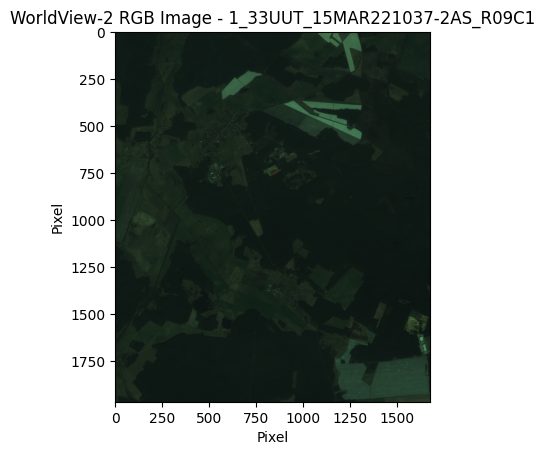

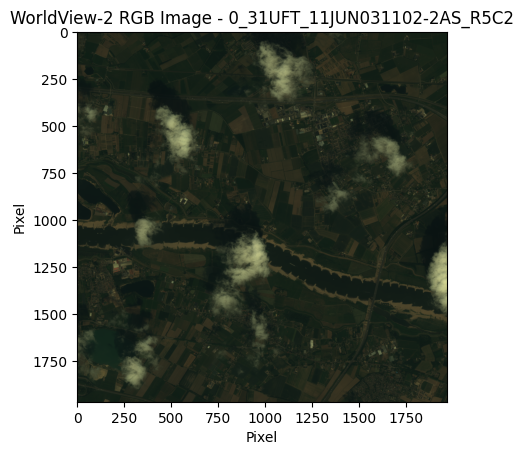

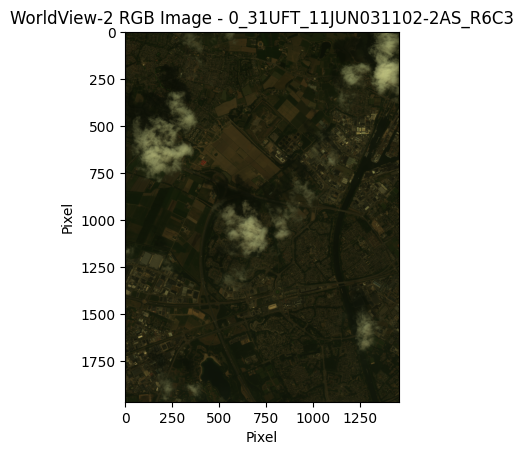

In [63]:
import os
import rasterio
import numpy as np
import matplotlib.pyplot as plt

def plot_wv2_rgb(directory_path):
    """
    Iteriert über jeden Unterordner im angegebenen Verzeichnis und plottet die RGB-Bilder von WorldView-2.
    
    Parameters:
    directory_path (str): Pfad zum Hauptverzeichnis, das die Unterordner enthält.
    """
    # Iteriere über jeden Unterordner im Verzeichnis
    for folder_name in os.listdir(directory_path):
        folder_path = os.path.join(directory_path, folder_name)
        
        if os.path.isdir(folder_path):  # Überprüfen, ob es sich um ein Verzeichnis handelt
            # Pfade zu den Banddateien zusammenstellen
            red_path = os.path.join(folder_path, 'hr_resized/mul_band_4.tiff')
            green_path = os.path.join(folder_path, 'hr_resized/mul_band_2.tiff')
            blue_path = os.path.join(folder_path, 'hr_resized/mul_band_1.tiff')

            # Prüfen, ob die Dateien existieren
            if os.path.exists(red_path) and os.path.exists(green_path) and os.path.exists(blue_path):
                # Rotkanal lesen
                with rasterio.open(red_path) as src:
                    red = src.read(1)

                # Grünkanal lesen
                with rasterio.open(green_path) as src:
                    green = src.read(1)

                # Blaukanal lesen
                with rasterio.open(blue_path) as src:
                    blue = src.read(1)

                # RGB-Bild zusammensetzen
                rgb = np.dstack((red, green, blue))
                

                # RGB-Bild plotten
                plt.imshow(rgb)
                plt.title(f'WorldView-2 RGB Image - {folder_name}')
                plt.xlabel('Pixel')
                plt.ylabel('Pixel')
                plt.show()

# Beispielaufruf der Funktion mit dem Pfad zum Hauptverzeichnis
plot_wv2_rgb('/home/jovyan/work/saved_data/sbench/image_data/')


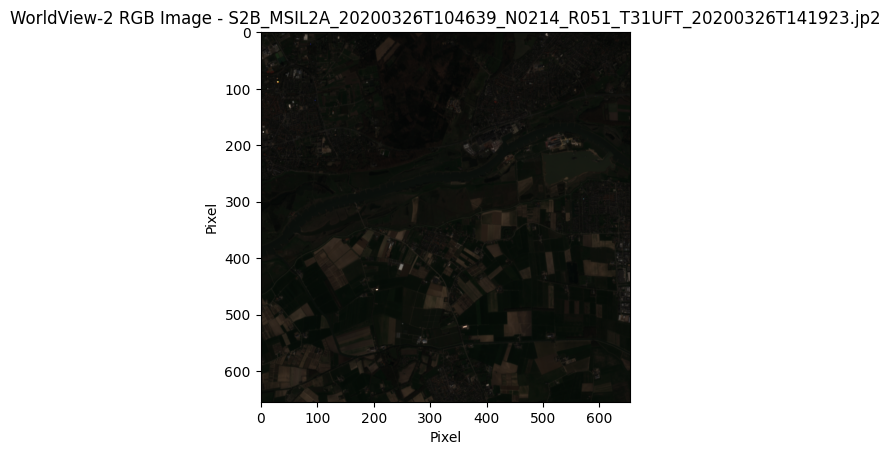

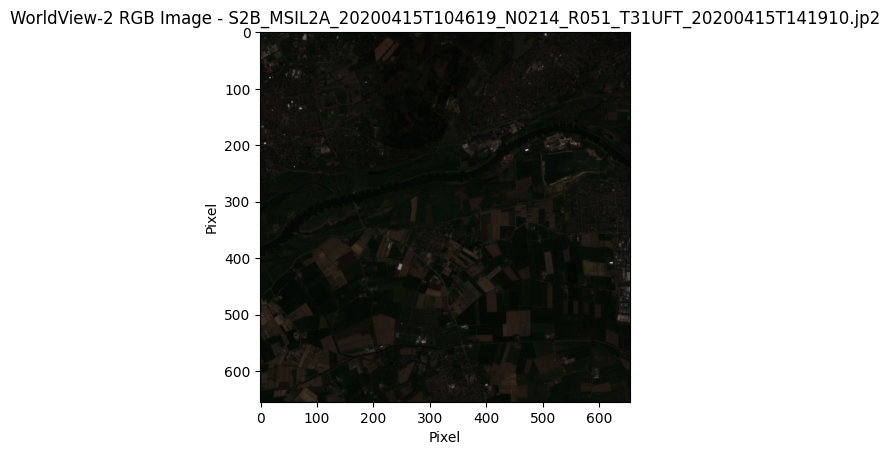

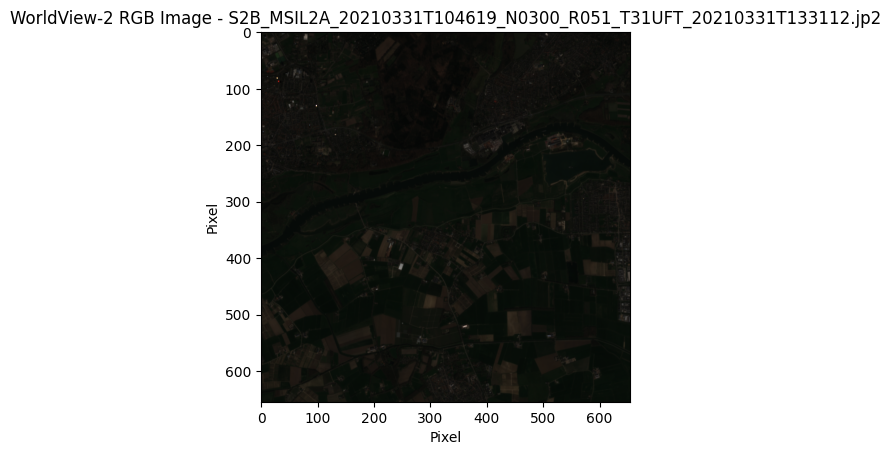

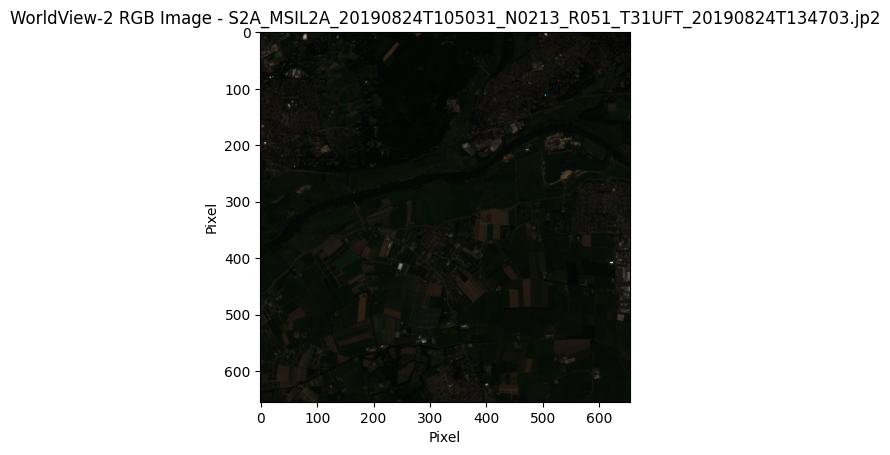

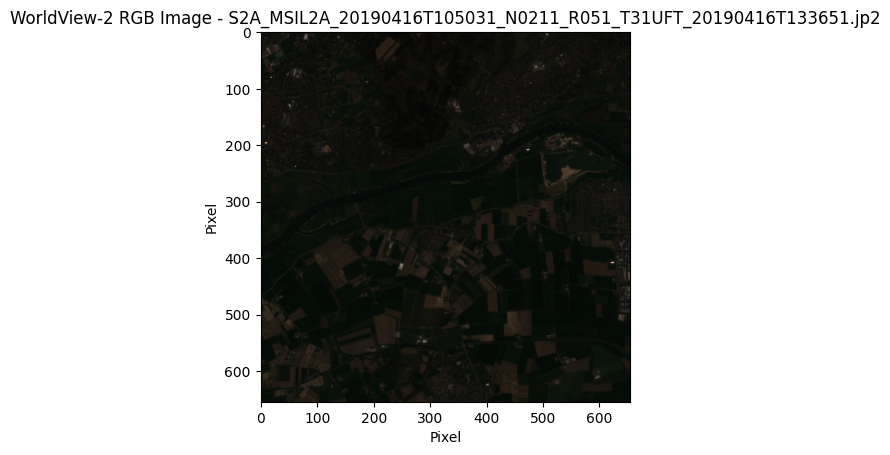

...

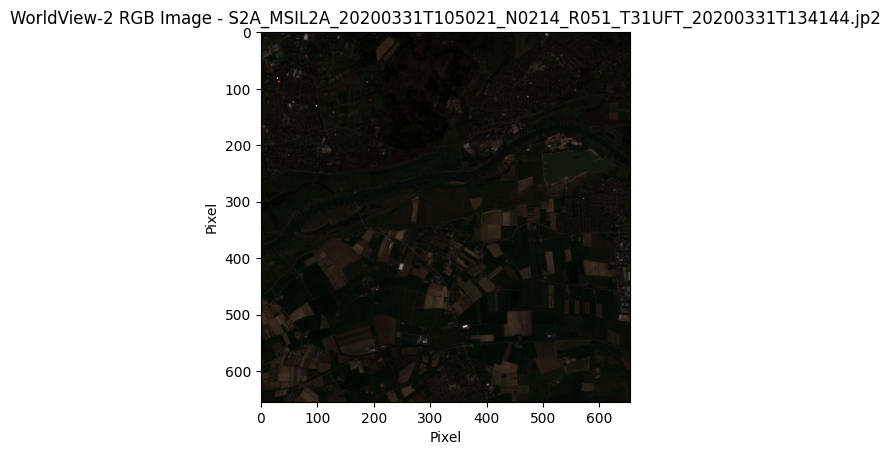

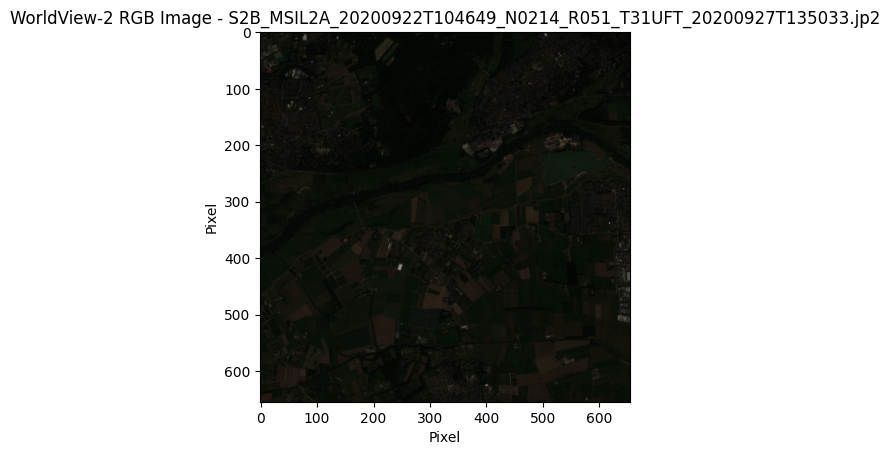

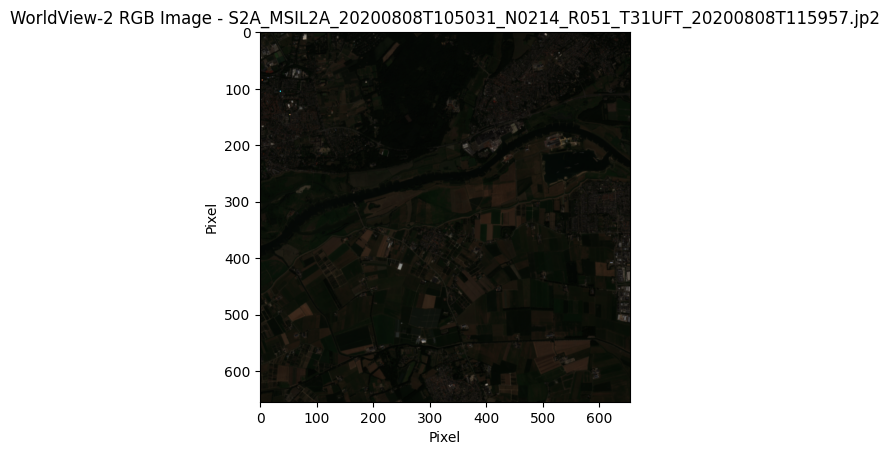

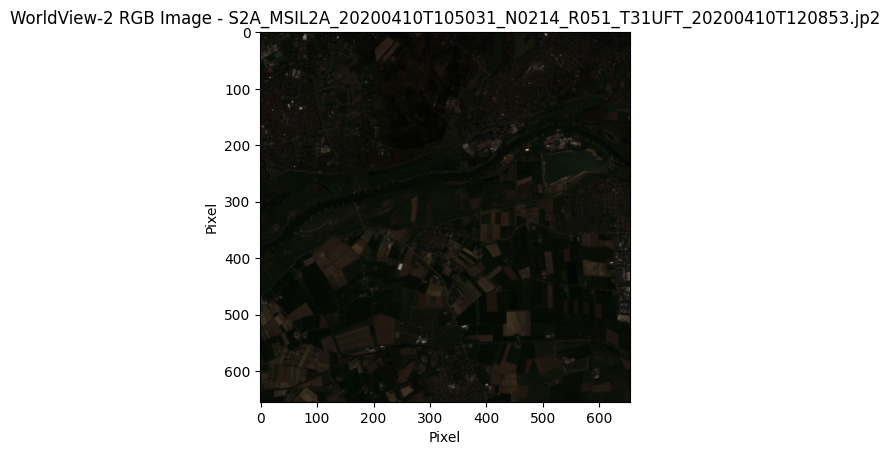

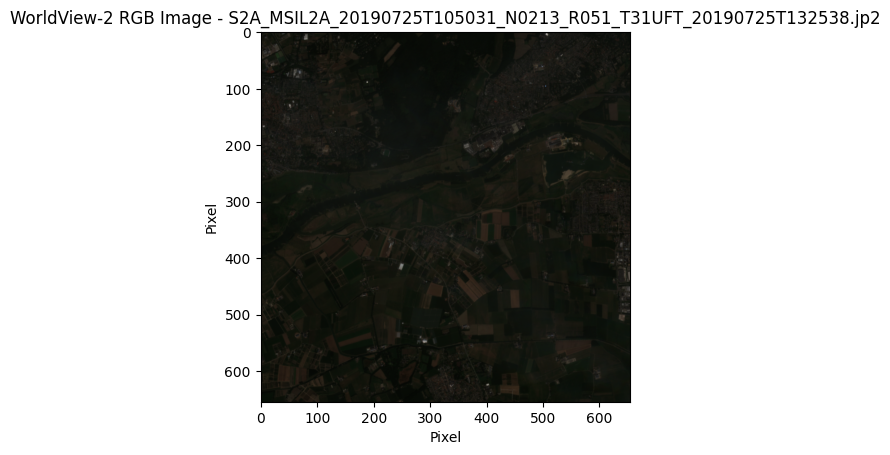

In [64]:
import os
import rasterio
import numpy as np
import matplotlib.pyplot as plt

def scale_to_8bit(data_array, max_value=10000):
    """ Skaliert die Bilddaten auf den 8-Bit-Bereich (0-255). """
    data_array = np.clip(data_array, 0, max_value)  # Werte über max_value abschneiden
    normalized = data_array / max_value  # Normalisiere auf den Bereich von 0 bis 1
    return (normalized * 255).astype(np.uint8)  # Skaliere auf den Bereich von 0 bis 255

def plot_wv2_rgb(directory_path):
    """
    Iteriert über jeden Unterordner im angegebenen Verzeichnis und plottet die RGB-Bilder von WorldView-2.
    
    Parameters:
    directory_path (str): Pfad zum Hauptverzeichnis, das die Unterordner enthält.
    """
    # Iteriere über jeden Unterordner im Verzeichnis
    for filname in os.listdir(directory_path):
        pathr = '/home/jovyan/work/saved_data/sbench/image_data/0_31UFT_11JUN031102-2AS_R4C2/b4/lrs/'
        pathg = '/home/jovyan/work/saved_data/sbench/image_data/0_31UFT_11JUN031102-2AS_R4C2/b3/lrs/'
        pathb = '/home/jovyan/work/saved_data/sbench/image_data/0_31UFT_11JUN031102-2AS_R4C2/b2/lrs/'
        
            # Pfade zu den Banddateien zusammenstellen
        red_path = os.path.join(pathr, filname)
        green_path = os.path.join(pathg, filname)
        blue_path = os.path.join(pathb, filname)

            # Prüfen, ob die Dateien existieren
        if os.path.exists(red_path) and os.path.exists(green_path) and os.path.exists(blue_path):
            # Rotkanal lesen
            with rasterio.open(red_path) as src:
                red = src.read(1)
                red_scaled = scale_to_8bit(red)

            # Grünkanal lesen
            with rasterio.open(green_path) as src:
                green = src.read(1)
                green_scaled = scale_to_8bit(green)

            # Blaukanal lesen
            with rasterio.open(blue_path) as src:
                blue = src.read(1)
                blue_scaled = scale_to_8bit(blue)

            # RGB-Bild zusammensetzen
            rgb = np.dstack((red_scaled, green_scaled, blue_scaled))
                

            # RGB-Bild plotten
            plt.imshow(rgb)
            plt.title(f'WorldView-2 RGB Image - {filname}')
            plt.xlabel('Pixel')
            plt.ylabel('Pixel')
            plt.show()

# Beispielaufruf der Funktion mit dem Pfad zum Hauptverzeichnis
plot_wv2_rgb('/home/jovyan/work/saved_data/sbench/image_data/0_31UFT_11JUN031102-2AS_R4C2/b2/lrs/')


In [ ]:
with rasterio.open('/home/jovyan/work/saved_data/sbench/image_data/2_33UUU_14SEP051050-2AS_R07C3/b2/lrs/') as src:
    red = src.read(1)
    red_scaled = scale_to_8bit(red)

            # Grünkanal lesen
with rasterio.open(green_path) as src:
    green = src.read(1)
    green_scaled = scale_to_8bit(green)

            # Blaukanal lesen
with rasterio.open(blue_path) as src:
    blue = src.read(1)
    blue_scaled = scale_to_8bit(blue)

            # RGB-Bild zusammensetzen
rgb = np.dstack((red_scaled, green_scaled, blue_scaled))
                